<a href="https://colab.research.google.com/github/ProtossDragoon/Deep-Learning-with-Python/blob/main/Guidance_of_Braille_Blocks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Guidance of Braille Blocks

## Author

name : Janghoo Lee <br>
github : https://github.com/ProtossDragoon <br>
contact : dlwkdgn1@naver.com <br>
circle : https://github.com/sju-coml <br>
organization : https://web.deering.co/ <br>
published date : November, 2021


## Related Notebook

[Notebooks](https://github.com/ProtossDragoon/paper_implementation_and_testing_tf2/tree/main/notebooks)


# Environment

In [151]:
# 내장
import os, sys
import time

# 서드파티
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

## Google Drive / Git

In [152]:
#!rm -r /content/gdrive/
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


### PathManager

#### 주의

아래 클래스를 수정할 때에는 [다른 노트북](https://colab.research.google.com/drive/1imYelcKE1dQd7SPa82Uhdg_vW5avxxy6?usp=sharing) 에도 중복된 코드가 존재한다는 사실을 인지해 주세요.

In [153]:
class PathManager():
    #FIXME: clean code
    
    def __init__(
        self,
        gdrive_home_dir:str='/content/gdrive/MyDrive',
        workspace_dir_from_home_dir:str='ColabWorkspace',
        data_dir_from_home_dir:str='data',
        git_repo_name:str='paper_implementation_and_testing_tf2',
    ):
        self._set_dirs(
            data_dir_from_home_dir,
            workspace_dir_from_home_dir,
            git_repo_name,
            gdrive_home_dir=gdrive_home_dir,
            )
        self.gcs_mode = False
        self.gcp_initialized = False

    def _set_dirs(self,
        data_dir_from_home_dir,
        workspace_dir_from_home_dir,
        git_repo_name,
        gdrive_home_dir=None,
        gcs_home_dir=None,
    ):
        """경로 관련 모든 클래스 변수의 저장은
        여기서 이루어집니다.
        """
        if gdrive_home_dir:
            assert not gcs_home_dir
            self.gdrive_home_dir = gdrive_home_dir
            self.home_dir = self.gdrive_home_dir
        if gcs_home_dir:
            assert not gdrive_home_dir
            self.gcs_home_dir = gcs_home_dir
            self.home_dir = self.gcs_home_dir
        
        self._cache_data_dir_from_home_dir = data_dir_from_home_dir
        self._cache_workspace_dir_from_home_dir = workspace_dir_from_home_dir
        self._cache_git_repo_name = git_repo_name

        self.ws          = os.path.join(self.home_dir, workspace_dir_from_home_dir)
        self.git_repo_ws = os.path.join(self.ws, git_repo_name)
        self.data_dir    = os.path.join(self.home_dir, data_dir_from_home_dir)
        self.models_dir  = os.path.join(self.git_repo_ws, 'models')

    def init_gcs(
        self,
        gcs_bucket_name:str,
        gcp_project_name:str,
        gcp_project_id:str,
        gcp_region:str,
    ):
        """구글 클라우드 서비스 관련 정보를 저장하고, 
        권한을 인증해 앞으로 사용할 수 있도록 합니다.
        """
        self.gcp_initialized = True
        self.gcp_bucket_name = gcs_bucket_name
        self.gcp_project_name = gcp_project_name
        self.gcp_project_id = gcp_project_id
        self.gcp_region = gcp_region

        # this is always set on Colab, the value is 0 or 1 depending on GPU presence
        _is_colab_backend = 'COLAB_GPU' in os.environ
        if _is_colab_backend:
            if 'google.colab' in sys.modules:
                from google.colab import auth
                auth.authenticate_user()
                os.environ['GOOGLE_CLOUD_PROJECT'] = self.gcp_project_id      

    def set_to_gcs_mode(self,
        gcs_mode=True
    ):
        """실행 모드를 gcs mode 로 변경하고, 
        멤버 변수에 저장된 모든 경로를 변경합니다.
        """
        if not self.gcp_initialized:
            raise NotImplementedError('init_gcs() 을 먼저 실행하세요.')
        self.gcs_mode = gcs_mode
        if self.gcs_mode:
            self._set_dirs(
                self._cache_data_dir_from_home_dir,
                self._cache_workspace_dir_from_home_dir,
                self._cache_git_repo_name,
                gcs_home_dir=os.path.join('gs://', self.gcp_bucket_name)
            )
        else:
            self._set_dirs(
                self._cache_data_dir_from_home_dir,
                self._cache_workspace_dir_from_home_dir,
                self._cache_git_repo_name,
                gdrive_home_dir=self.gdrive_home_dir
            )

paths = PathManager()

## Perpare Data and Model

- 정성적(qualitative) 으로 평가할 데이터셋이 GDrie 에 저장되어 있는 상황입니다.
- 모델이 GCP 에 저장되어 있는 상황입니다.

### Data

In [154]:
TARGET_DATA_DIR_POSTFIX = 'rosbag/rosbag_image_no_pc_crosswalk_return_cloudy' #@param ['rosbag/rosbag_image_no_pc_crosswalk_return_cloudy', 'rosbag/rosbag_image_no_pc_river_cloudy']
TARGET_DATA_DIR = os.path.join(paths.data_dir, TARGET_DATA_DIR_POSTFIX)

/content/gdrive/MyDrive/data/rosbag/rosbag_image_no_pc_crosswalk_return_cloudy


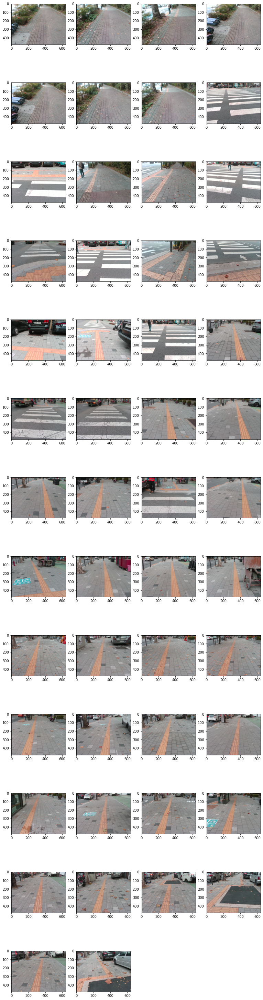

In [155]:
%cd {TARGET_DATA_DIR}
CONVERT_COLOR_FORMAT = False #@param {type:"boolean"}

im_li = []
for name in os.listdir(TARGET_DATA_DIR):
    im = cv2.imread(name)
    if CONVERT_COLOR_FORMAT:
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im_li.append(im)

def vis_all(im_li):
    plt.figure(figsize=[13, 4+len(im_li)])
    for idx, im in enumerate(im_li, 1):
        plt.subplot(len(im_li)//4+1, 4, idx)
        plt.imshow(im)

vis_all(im_li)

### Model

In [156]:
USE_GCS = True #@param {type:"boolean"}
if USE_GCS:
    GCP_BUCKET_NAME = "deer-newdolph" #@param {type:"string"}
    GCP_PROJECT_NAME = "newdolph" #@param {type:"string"}
    GCP_PROJECT_ID = "flowing-digit-326103" #@param {type:"string"}
    GCP_REGION = 'us-central1'
    paths.init_gcs(
        GCP_BUCKET_NAME,
        GCP_PROJECT_NAME,
        GCP_PROJECT_ID,
        GCP_REGION,
    )
    paths.set_to_gcs_mode(True)

MODEL_PATH_POSTFIX = 'PEDESTRIAN/SURFACE_MASKING/UNET_MOBILENETV2/b128_9c_224_224_tpu_tfrecord_gcs' #@param {type:"string"}
MODEL_PATH = os.path.join(paths.models_dir, MODEL_PATH_POSTFIX)

print(f'savedmodel {MODEL_PATH} was selected')
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

savedmodel gs://deer-newdolph/ColabWorkspace/paper_implementation_and_testing_tf2/models/PEDESTRIAN/SURFACE_MASKING/UNET_MOBILENETV2/b128_9c_224_224_tpu_tfrecord_gcs was selected


## Evaluate

다양한 해상도로 평가해 봅니다.

In [157]:
def mask_to_rgb(mask, interested_classid_to_rgb=None):
    if len(mask.shape) == 2: # [h, w]
        # grayscale input
        return mask
    elif len(mask.shape) == 3: # [h, w, c]
        # normal input
        pass
    else:
        # abnormal input
        raise NotImplementedError

    n_ch = mask.shape[-1]
    # print('Number of channel : {}'.format(n_ch))
    if n_ch == 1:
        print('Binary segmentation mask detected.')
        return mask.squeeze()

    idx = np.argmax(mask, axis=-1).squeeze() # [h, w]
    ret = np.zeros([mask.shape[0], mask.shape[1], 3], dtype=np.uint8)
    masking = np.zeros([mask.shape[0], mask.shape[1]], dtype=np.uint8)

    if interested_classid_to_rgb is None:
        # n color generation
        import colorsys
        HSV_tuples = [(x*1.0/n_ch, 0.5, 0.5) for x in range(n_ch)]
        RGB_tuples = map(lambda x: colorsys.hsv_to_rgb(*x), HSV_tuples)
        for i, color in enumerate(RGB_tuples):
            color_masking = np.ma.masked_where(idx == i, masking).mask
            color = (np.array(color) * 255).astype(np.uint8)
            ret[color_masking] = color
    else:
        # use interested_classid_to_rgb dictionary
        for i, (_, color) in enumerate(interested_classid_to_rgb.items()):

            # select color
            np_color = np.array(color)
            if len(np_color.shape) == 2: # e.g. (x, 3)
                if np_color.shape[0] == 1:
                    # single color
                    color = np_color[0]
                else:
                    # multiple color
                    color = np_color[0]
            else: # e.g. (3,)
                # single color
                color = np_color

            color_masking = np.ma.masked_where(idx == i, masking).mask
            ret[color_masking] = color

    assert ret.shape[-1] == 3
    return ret

In [158]:
def simple_norm(im):
    im = im.astype(np.float32)
    im /= 125.
    im -= 1.
    return im

def inference(
    model,
    im_li:list,
    inf_w:int=None, 
    inf_h:int=None
)->list:

    res_li = []
    time_elapse_li = []
    for it, im in enumerate(im_li, 1):

        if inf_w is None:
            inf_w = im.shape[1]
        if inf_h is None:
            inf_h = im.shape[0]

        s = time.time()
        im = cv2.resize(im, (inf_w, inf_h))
        im = simple_norm(im)
        res = model(np.expand_dims(im, axis=0))
        res = np.squeeze(res)
        res_li.append(mask_to_rgb(res))
        e = time.time()
        
        time_elapse_li.append(e-s)

    if it > 2:
        t = (sum(time_elapse_li)-max(time_elapse_li))/(it-1)
    else:
        t = sum(time_elapse_li)/it

    print(f'iteration {it}, average inference time '
          f'on h, w:{(inf_h, inf_w)} shaped image consumes: {t:.2} second(s) per step')
        
    return res_li

iteration 50, average inference time on h, w:(480, 640) shaped image consumes: 0.1 second(s) per step


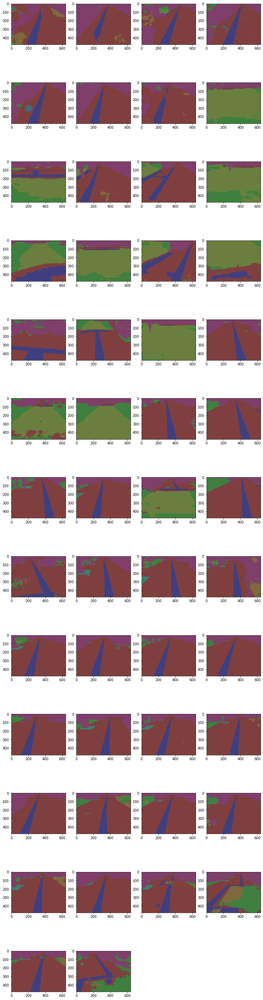

In [159]:
res_li = inference(model, im_li)
vis_all(res_li)

iteration 50, average inference time on h, w:(288, 384) shaped image consumes: 0.08 second(s) per step


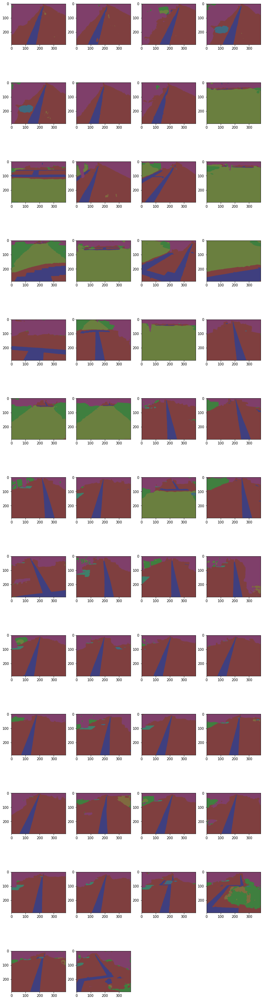

In [160]:
res_li = inference(model, im_li, 384, 288)
vis_all(res_li)

iteration 50, average inference time on h, w:(320, 320) shaped image consumes: 0.076 second(s) per step


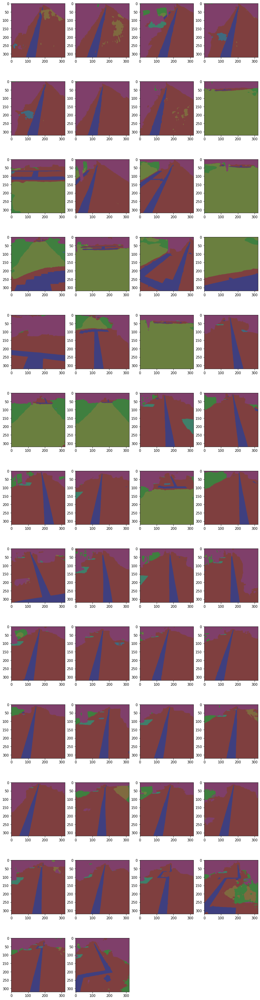

In [161]:
res_li = inference(model, im_li, 320, 320)
vis_all(res_li)

iteration 50, average inference time on h, w:(224, 224) shaped image consumes: 0.07 second(s) per step


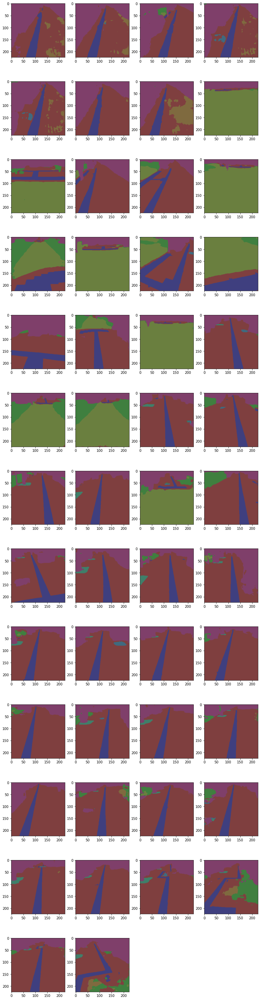

In [162]:
res_li = inference(model, im_li, 224, 224)
vis_all(res_li)

# Detect Barille Blocks

## Skeletonization

https://github.com/Image-Py/sknw

In [163]:
paths.set_to_gcs_mode(False)
%cd {paths.ws}
!git clone https://github.com/Image-Py/sknw.git
%ls -al

/content/gdrive/MyDrive/ColabWorkspace
fatal: destination path 'sknw' already exists and is not an empty directory.
total 24
drwx------ 2 root root 4096 Nov  3 09:04 albumentations/
drwx------ 2 root root 4096 Jun 22 02:12 efficientnet/
drwx------ 2 root root 4096 Jun 25 04:43 .ipynb_checkpoints/
drwx------ 2 root root 4096 May 25 05:07 paper_implementation_and_testing_tf2/
drwx------ 2 root root 4096 Jun 22 02:12 segmentation_models/
drwx------ 4 root root 4096 Nov 16 09:47 sknw/


from 
[[ 63  63 127]
 [127  63  63]
 [127  63 106]
 [127 106  63]] unique colors,
selected (63, 63, 127) color as barille block class.

color picking algorithm fn on h, w:(224, 224) shaped image consumes 0.00250 second(s)


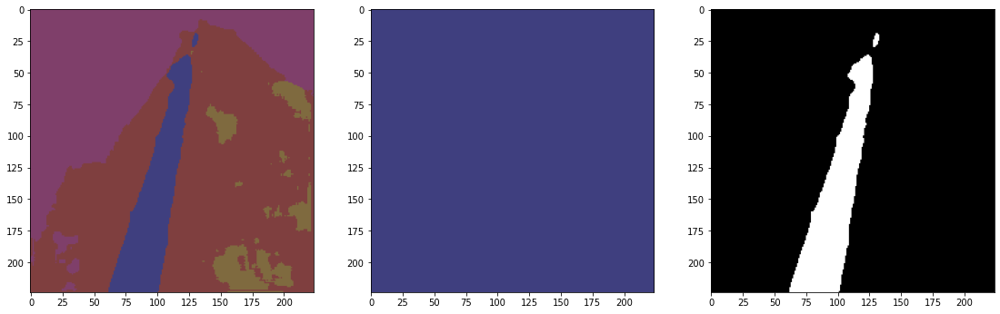

In [164]:
BARILLE_COLOR = (63, 63, 127) #@param {dtype:"list"}

im = res_li[0]
im_w = im.shape[1]
im_h = im.shape[0]
im_ch = im.shape[-1]
print(f'from \n{np.unique(im.reshape(-1, im_ch), axis=0)} unique colors,')
print(f'selected {BARILLE_COLOR} color as barille block class.\n')

# filtering
def color_picking(im):

    s = time.time()
    im_h, im_w, im_ch = im.shape
    cond = (im.reshape(-1, im_ch) == BARILLE_COLOR)
    cond = np.all(cond, axis=-1)
    cond = cond.reshape(im_h, im_w)
    binary_im = cond.astype(np.float32)
    e = time.time()    
    print(f'color picking algorithm fn '
          f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.5f} second(s)')

    return binary_im

color_im = np.ones((im_h, im_w, im_ch),dtype=np.uint8)*BARILLE_COLOR
binary_im = color_picking(im)

# visualize
plt.figure(figsize=[19,6])

plt.subplot(1,3,1,)
plt.imshow(im)

plt.subplot(1,3,2,)
plt.imshow(color_im)

plt.subplot(1,3,3,)
plt.imshow(binary_im, cmap='gray')

In [165]:
from skimage.util import invert
from skimage.morphology import skeletonize

zhang's method skeletonize fn on h, w:(224, 224) shaped image consumes 0.002 second(s)
lee's method skeletonize fn on h, w:(224, 224) shaped image consumes 0.005 second(s)


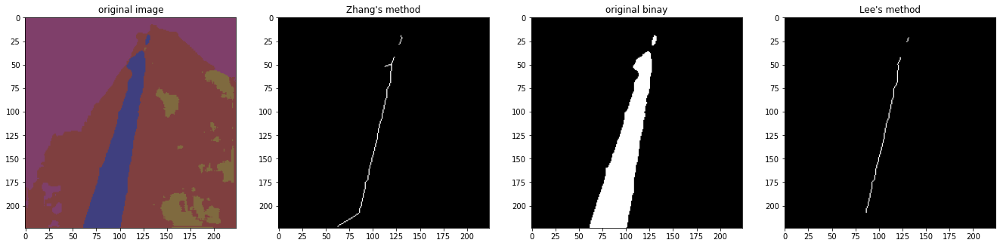

In [167]:
# perform skeletonization
def run_skeletonize(binary_im, method=None):
    im_h, im_w, = binary_im.shape
    if method is None:
        method = 'zhang'        
    s = time.time()
    skeleon_binary_im = skeletonize(binary_im, method=method)
    e = time.time()
    print(f'{method}\'s method skeletonize fn ' 
          f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.3f} second(s)')
    return skeleon_binary_im


def vis_skeletonization(
    im,
    zhang_skel,
    binary_im,
    lee_skel,
):
    ret_ax_li = []

    # visualize
    plt.figure(figsize=(23,8))
    
    ax = plt.subplot(1,4,1,)
    ax.set_title('original image')
    plt.imshow(im, cmap='gray')
    ret_ax_li.append(ax)

    ax = plt.subplot(1,4,2,)
    ax.set_title('Zhang\'s method')
    plt.imshow(zhang_skel, cmap='gray')
    ret_ax_li.append(ax)

    ax = plt.subplot(1,4,3,)
    ax.set_title('original binay')
    plt.imshow(binary_im, cmap='gray')
    ret_ax_li.append(ax)

    ax = plt.subplot(1,4,4,)
    ax.set_title('Lee\'s method')
    plt.imshow(lee_skel, cmap='gray')
    ret_ax_li.append(ax)
    
    return ret_ax_li


zhang_skel = run_skeletonize(binary_im, method='zhang')
lee_skel = run_skeletonize(binary_im, method='lee')
vis_skeletonization(
    im,
    zhang_skel,
    binary_im,
    lee_skel,
)

'ransac' line fitting method fn on h, w:(224, 224) shaped image consumes 0.003 second(s)
{'_residues': 870.1936795942057,
 'coef_': array([-0.23654912]),
 'copy_X': True,
 'fit_intercept': True,
 'intercept_': 133.8164153603246,
 'n_features_in_': 1,
 'n_jobs': None,
 'normalize': 'deprecated',
 'positive': False,
 'rank_': 1,
 'singular_': array([787.42553908])}
Parsing inliner result of line fitting on h, w:(224, 224) shaped image consumes 0.00362 second(s)


(array([ 19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  42,  43,  44,
         45,  46,  47,  48,  49,  50,  50,  50,  50,  51,  51,  51,  51,
         52,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
         64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
         77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
         90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
        103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
        116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
        129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
        142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
        155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
        168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180,
        181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193,
        194, 195, 196, 197, 198, 199, 200, 201, 202

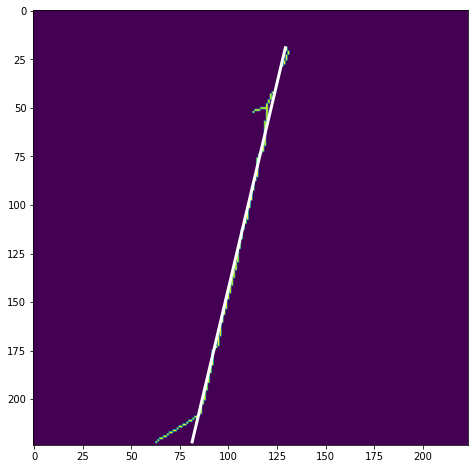

In [175]:
from sklearn import linear_model

def line_fitting(
    binary_im, 
    method='ransac'
):
    im_h, im_w, = binary_im.shape
    s = time.time()
    x, y = indices = np.nonzero(binary_im)
    inp_x = x.reshape([-1,1])
    if method == 'ransac':
        _model = linear_model.RANSACRegressor()
    elif method == 'linear':
        _model = linear_model.LinearRegression()
    else:
        raise NotImplementedError
    
    try:
        _model.fit(inp_x, y)
    except ValueError:
        # x, y 점이 하나도 존재하지 않음
        x = []
        y_hat = []
    else:
        y_hat = _model.predict(inp_x)
        e = time.time()
        print(f'{repr(method)} line fitting method fn ' 
            f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.3f} second(s)')

    return x, y_hat, _model


def parse_inlier(
    binary_im,
    ransac_model
):
    im_h, im_w, = binary_im.shape

    s = time.time()
    x, y = indices = np.nonzero(binary_im)
    ma = ransac_model.inlier_mask_
    x = x[ma]
    y = y[ma]
    e = time.time()

    print(f'Parsing inliner result of line fitting '
        f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.5f} second(s)')

    return x, y

x, y_hat, ransac_model = line_fitting(zhang_skel)
plt.figure(figsize=[13,8])
plt.imshow(zhang_skel)
plt.plot(
    y_hat, x,
    color='white', 
    linewidth=3,
)

import pprint
pprint.pprint(ransac_model.estimator_.__dict__)
parse_inlier(zhang_skel, ransac_model)

iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.086 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00334 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00078 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00083 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.002 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00066 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consume

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.078 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00295 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.002 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00033 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00068 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00061 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consume

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00027 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00073 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00059 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.075 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00286 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00084 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00081 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00059 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.082 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00289 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00094 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.078 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00285 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00070 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00068 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.016 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00028 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00080 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00061 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.085 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00296 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.00

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00093 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.010 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00168 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00068 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.078 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00289 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00087 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.076 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00290 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00090 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00081 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.012 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00027 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00074 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.002 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00059 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.075 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00290 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.012 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00026 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00072 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.002 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00061 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.077 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00287 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00028 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00078 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.002 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00060 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.076 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00304 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00107 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00082 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.002 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00060 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.078 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00287 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.011 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.085 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00300 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.012 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00071 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00073 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00060 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consume

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00049 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00075 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.002 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00059 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.08 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00287 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.079 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00293 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00027 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00075 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00060 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consume

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.019 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00065 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.010 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00099 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00079 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.087 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00290 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.011 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00030 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.010 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00076 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00083 second(s)
--


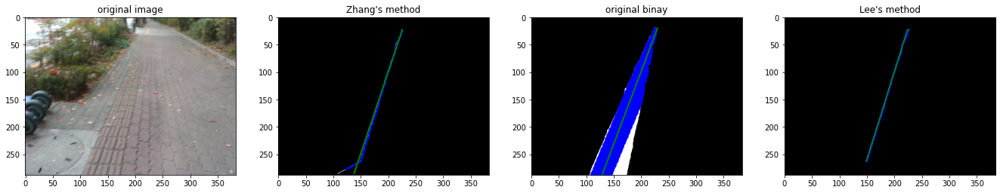

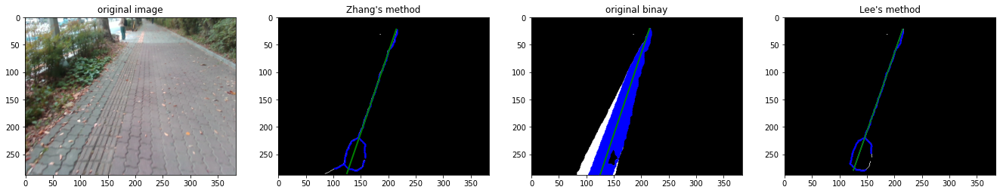

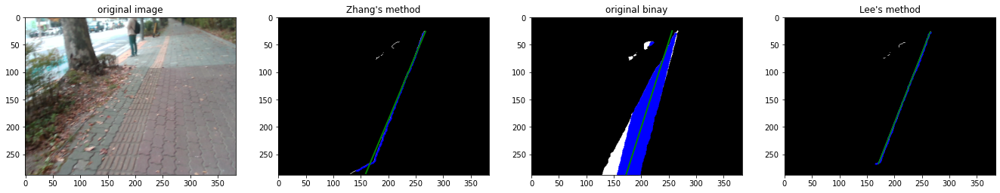

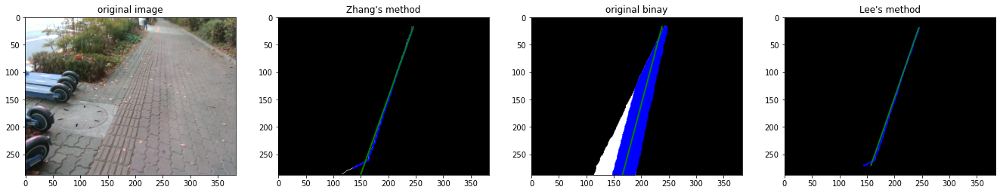

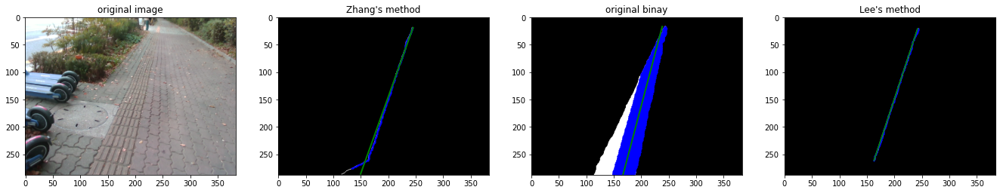

...

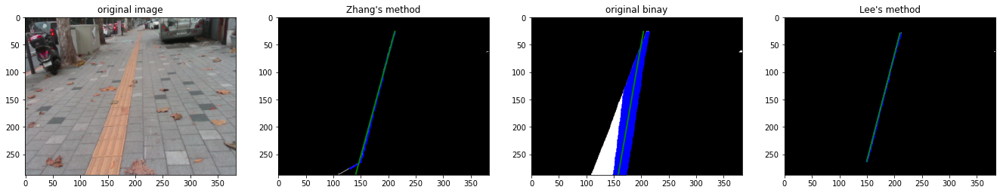

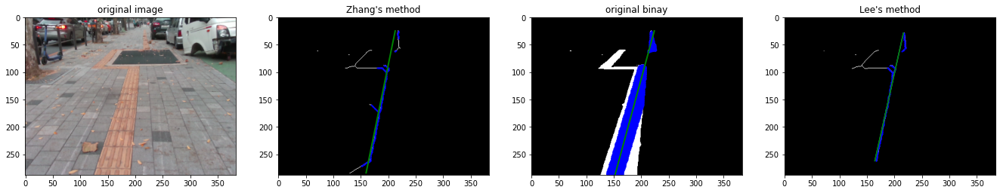

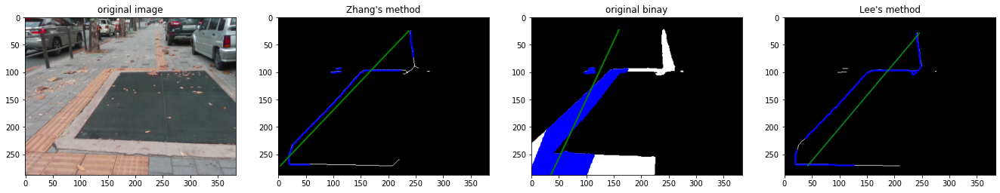

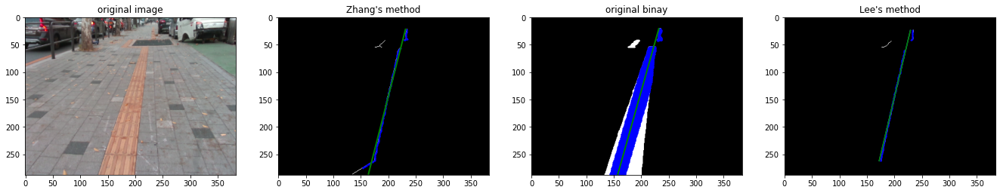

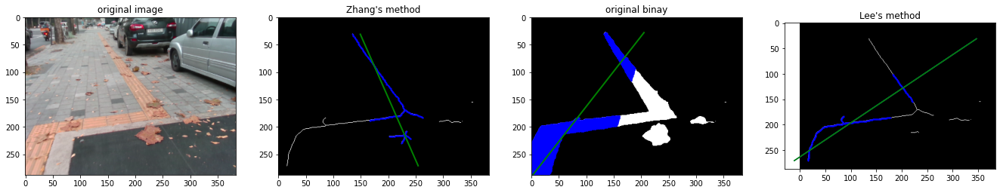

In [176]:
def result_generator(
    im_li:list,
    inf_w:int=224,
    inf_h:int=224,
):
    for idx, im in enumerate(im_li):

        im = cv2.resize(im, (inf_w, inf_h))
        res = inference(model, [im], inf_w, inf_h,)
        binary_im = color_picking(*res)

        yield (
            im,
            run_skeletonize(binary_im, method='zhang'),
            binary_im,
            run_skeletonize(binary_im, method='lee'),
        )

def vis_all_skeletonization(
    gen, *, 
    drawfig_maxn=None, 
    **kwargs
)->None:
    for idx, (original_im,
              zhang_method_im,
              original_binary_im,
              lee_mehtod_im,) in enumerate(gen, 1):
        axes = vis_skeletonization(
            original_im,
            zhang_method_im,
            original_binary_im,
            lee_mehtod_im,
            **kwargs,
        )

        # zhang_method_im
        x, y_hat, _ransac_model = line_fitting(zhang_method_im)
        axes[1].plot(
            y_hat, x,
            color='green', 
            linewidth=2)
        try:
            x, y_hat = parse_inlier(zhang_method_im, _ransac_model)
        except:
            print('Line to fit does not exists.')
        else:
            axes[1].scatter(
                y_hat, x, 
                s=1,
                color='blue',)

        # original_binary_im
        x, y_hat, _ransac_model = line_fitting(original_binary_im)
        axes[2].plot(
            y_hat, x,
            color='green', 
            linewidth=2)
        try:
            x, y_hat = parse_inlier(original_binary_im, _ransac_model)
        except:
            print('Line to fit does not exists.')
        else:
            axes[2].scatter(
                y_hat, x,
                s=1,
                color='blue',)

        # lee_mehtod_im
        x, y_hat, _ransac_model = line_fitting(lee_mehtod_im)
        axes[3].plot(y_hat, x)
        axes[3].plot(
            y_hat, x,
            color='green')

        try:
            x, y_hat = parse_inlier(lee_mehtod_im, _ransac_model)
        except:
            print('Line to fit does not exists.')
        else:
            axes[3].scatter(
                y_hat, x, 
                s=1,
                color='blue',)

        if drawfig_maxn:
            if idx >= drawfig_maxn:
                break
        print('--')

vis_all_skeletonization(result_generator(im_li, inf_w=384, inf_h=288), drawfig_maxn=0)

## Superpixel